# Residual Integration Neural Net

# Problem statement :

Let us consider a dynamical system, whose time-varying state $X_t$ is governed by the following ordinary differential equation (ODE):

\begin{equation}
\frac{dX_t}{dt}= F(t,X_t)
\label{eq:sys dyn}
\end{equation}

where $F$ is the dynamical operator. Most of the time, this ODE cannot be solved analytically and numerical integration techniques using discrete approximations are implemented. 

In this work, we focus on explicit integration schemes. A one-step explicit integration scheme is defined as: 

\begin{equation}
\label{eq:int_gen_schm}
X_{t_{n+1}} = X_{t_{n}} + h\cdot\Phi(t_{n},X_{t_{n}},h)
\end{equation}

with $\Phi(t_{n},X_{t_{n}},h)$ a numerical integration operator. Here, we aim to learn a prediction operator based on $\Phi$ and an approximation of the dynamical model $F(t,X_t)$ so that the forecasting error (typically, a one-step-ahead error) is minimized.

In this notebook, will learn an approximation of both $\Phi$ and $F(t,X_t)$ of the lorenz 63 model given a poorly sampled time series.


In [ ]:
# We mount google drive
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [ ]:
# Imports
import sys
sys.path.insert(0,'/content/drive/MyDrive/Colab Notebooks/RINN-master')

from generate_data import generate_data
import numpy as np
import matplotlib.pyplot as plt
import torch
from torch.autograd import Variable

# RMSE : root mean squared error 
def RMSE(a,b): 
    return np.sqrt(np.mean((a-b)**2))

from tqdm import tqdm

In [ ]:
# Matplotlib
import matplotlib.pyplot as plt
import matplotlib as mpl


mpl.rcParams['figure.dpi']=300

from mpl_toolkits.mplot3d import axes3d  

Lorenz-63 system is governed by :
$\left\lbrace
\begin{array}{c}
\dfrac{\mathrm{d}x(t)}{\mathrm{d}t}&=&\sigma(y(t)-x(t))\\
\dfrac{\mathrm{d}y(t)}{\mathrm{d}t}&=&\rho x(t)-y(t)-x(t)z(t)\\
\dfrac{\mathrm{d}z(t)}{\mathrm{d}t}&=&(t)y(t)-\beta z(t)
\end{array}\right.$
with $(\sigma,\rho,\beta)=(10,28,\dfrac{8}{3})$. The system is non-linear and chaotic.

In [ ]:
# dataset parameters

class GD:
    model = 'Lorenz_63'
    class parameters:
        sigma = 10.0
        rho = 28
        beta = 8.0/3


    dt_integration = 0.01 


    nb_loop_train = 4000.21 

    nb_loop_test = 100 

    
    sigma2_catalog = 0.0 

  
    sigma2_obs = 2.0 
    
    
    dt_states = 1 # number of integeration times between consecutive states (for xt and catalog)
    dt_obs = 8# number of integration times between consecutive observations (for yo)
    var_obs = np.array([0,1]) # indices of the observed variables
    
    
    

catalog, xt, yo = generate_data(GD)
init_cat = catalog.analogs

# Training data
batch_size = 100


In [ ]:
# LaTeX

!apt install cm-super
! sudo apt-get install texlive-latex-recommended 
! sudo apt-get install dvipng texlive-latex-extra texlive-fonts-recommended  
! wget http://mirrors.ctan.org/macros/latex/contrib/type1cm.zip 
! unzip type1cm.zip -d /tmp/type1cm 
! cd /tmp/type1cm/type1cm/ && sudo latex type1cm.ins
! sudo mkdir /usr/share/texmf/tex/latex/type1cm 
! sudo cp /tmp/type1cm/type1cm/type1cm.sty /usr/share/texmf/tex/latex/type1cm 
! sudo texhash 


Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following additional packages will be installed:
  cm-super-minimal fonts-droid-fallback fonts-lmodern fonts-noto-mono
  libcupsfilters1 libcupsimage2 libgs9 libgs9-common libijs-0.35 libjbig2dec0
  libkpathsea6 libpotrace0 libptexenc1 libsynctex1 libtexlua52 libtexluajit2
  libzzip-0-13 lmodern pfb2t1c2pfb poppler-data t1utils tex-common
  texlive-base texlive-binaries texlive-latex-base texlive-latex-recommended
Suggested packages:
  fonts-noto poppler-utils ghostscript fonts-japanese-mincho
  | fonts-ipafont-mincho fonts-japanese-gothic | fonts-ipafont-gothic
  fonts-arphic-ukai fonts-arphic-uming fonts-nanum debhelper gv
  | postscript-viewer perl-tk xpdf-reader | pdf-viewer texlive-latex-base-doc
  texlive-latex-recommended-doc texlive-pstricks
The following NEW packages will be installed:
  cm-super cm-super-minimal fonts-droid-fallback fonts-lmodern fonts-noto-mono
  libcupsfilter

In [ ]:
import numpy as np
from tqdm import tqdm
length_h = 1000
import matplotlib as mpl
import matplotlib.pyplot as plt
plt.rcParams["mathtext.fontset"] = "cm"
import matplotlib.pyplot as plt
plt.rcParams.update({'font.size': 30})
plt.rcParams.update({
    "text.usetex": True,
    "font.family": "sans-serif",
    "font.sans-serif": ["Helvetica"]})
## for Palatino and other serif fonts use:
plt.rcParams.update({
    "text.usetex": True,
    "font.family": "serif",
     "font.sans-serif": ["Helvetica"]})
plt.rcParams['axes.titlepad'] = 20 
plt.rcParams['axes.labelpad'] = 30




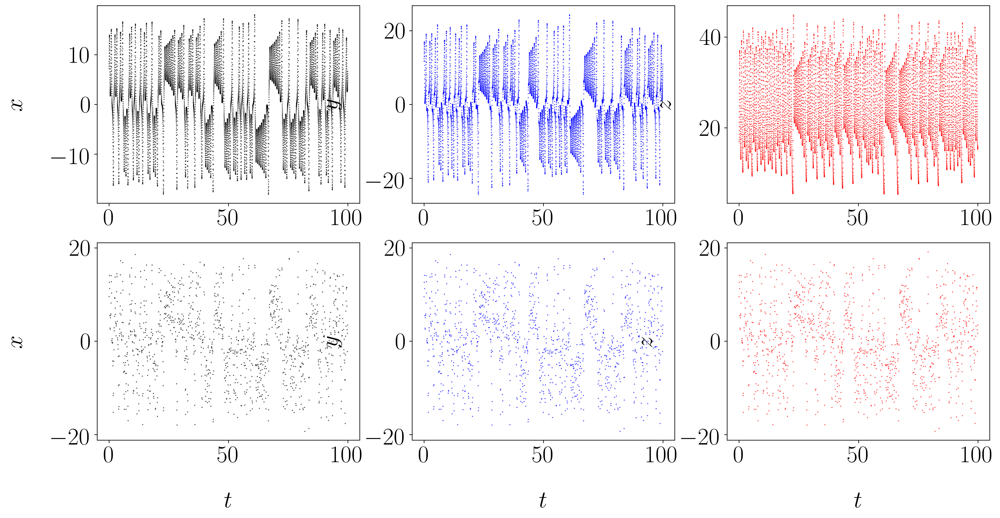

In [ ]:
fig=plt.figure(figsize=(20,10))

# True states
plt.title("Solution 'true' et solution bruitée")
plt.subplot(231)
plt.scatter(xt.time,xt.values[:,0],color='black',s=0.1)
plt.xlabel(r'$t$')
plt.ylabel(r'$x$')
plt.subplot(232)
plt.scatter(xt.time,xt.values[:,1],s=0.1,color='blue')
plt.xlabel(r'$t$')
plt.ylabel(r'$y$')
plt.subplot(233)
plt.scatter(xt.time,xt.values[:,2],s=0.1,color='red')
plt.xlabel(r'$t$')
plt.ylabel(r'$z$')


# Noisy states
plt.subplot(234)
plt.scatter(yo.time,yo.values[:,0],color='black',s=0.1)
plt.xlabel(r'$t$')
plt.ylabel(r'$x$')
plt.subplot(235)
plt.scatter(yo.time,yo.values[:,0],s=0.1,color='blue')
plt.xlabel(r'$t$')
plt.ylabel(r'$y$')
plt.subplot(236)
plt.scatter(yo.time,yo.values[:,0],s=0.1,color='red')
plt.xlabel(r'$t$')
plt.ylabel(r'$z$')

plt.savefig('/content/drive/MyDrive/Colab Notebooks/RINN-master/series_odeint_bruitee.png',dpi=300)

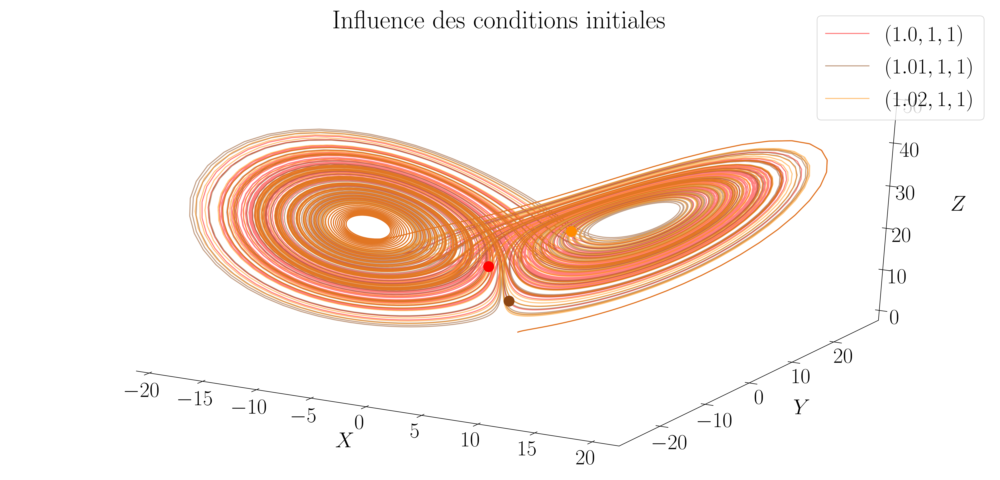

In [ ]:
# Influence of initial conditions

from scipy.integrate import odeint
from dynamical_models import Lorenz_63

colorList=['red','saddlebrown','darkorange','goldenrod']

fig = plt.figure(figsize=(20,10))
ax = fig.gca(projection='3d') 
ax.grid(False)
ax.w_xaxis.set_pane_color ((0., 0., 0., 0.))
ax.w_yaxis.set_pane_color ((0., 0., 0., 0.))
ax.w_zaxis.set_pane_color ((0., 0., 0., 0.))
for k in range(0,3):
  S=odeint(Lorenz_63,[1.0+0.01*k,1.0,1.0],np.arange(0,100,0.01),args=(GD.parameters.sigma,GD.parameters.rho,GD.parameters.beta))
  ax.plot(S[:,0], S[:,1], S[:,2], label=r'$({},1,1)$'.format(1.0+0.01*k),color=colorList[k],alpha=0.5)  # Tracé de la courbe 3D
  ax.scatter(S[9999,0], S[9999,1], S[9999,2],marker='.',s=800,color=colorList[k],alpha=1)
plt.title("Influence of initial conditions")
ax.set_xlabel(r'$X$')
ax.set_ylabel(r'$Y$')
ax.set_zlabel(r'$Z$')
ax.legend(loc='best')
plt.tight_layout()

plt.savefig('/content/drive/MyDrive/Colab Notebooks/RINN-master/odeint_3d_CI.png',dpi=300)
plt.show()

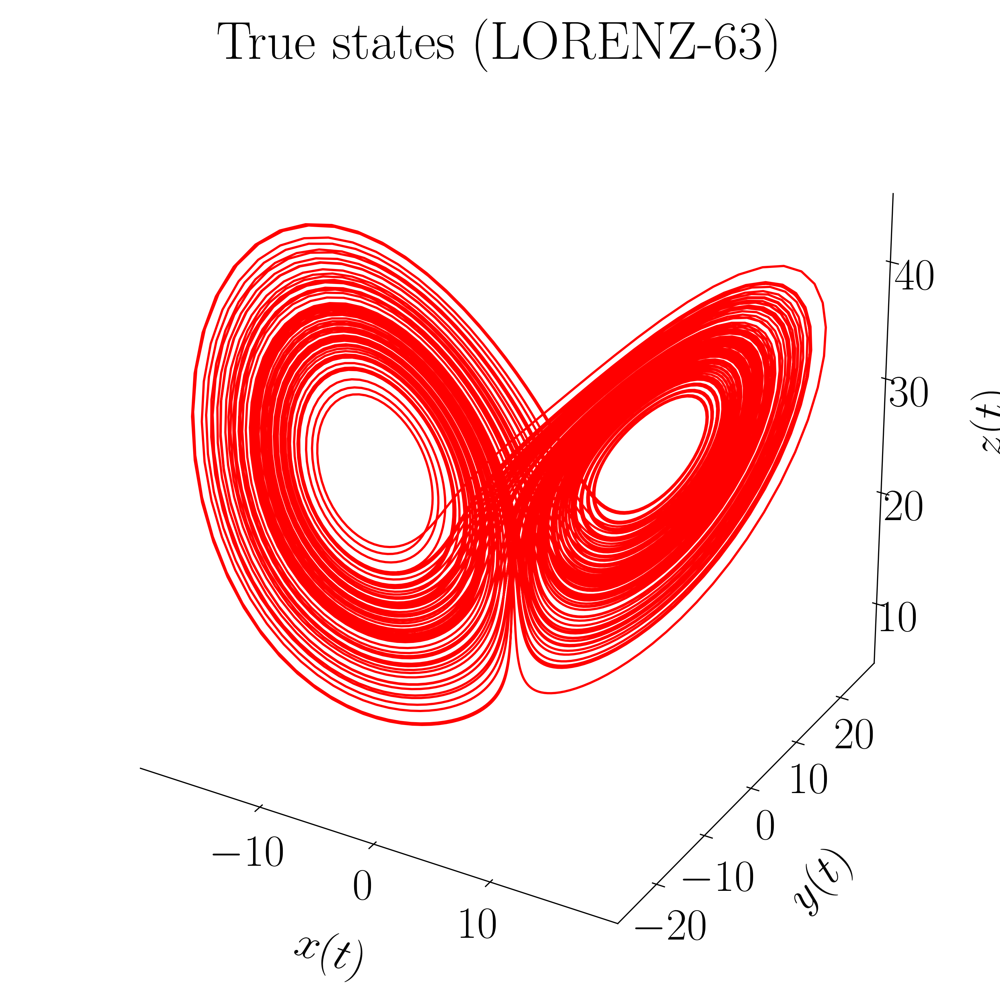

In [ ]:
fig = plt.figure(figsize=(10,10))
ax = fig.gca(projection='3d')  # Affichage en 3D
ax.grid(False)
ax.w_xaxis.set_pane_color ((0., 0., 0., 0.))
ax.w_yaxis.set_pane_color ((0., 0., 0., 0.))
ax.w_zaxis.set_pane_color ((0., 0., 0., 0.))
ax.plot(xt.values[:,0], xt.values[:,1], xt.values[:,2], label='Courbe',color='red')  # Tracé de la courbe 3D
plt.title("True states (LORENZ-63)")
ax.set_xlabel(r'$x(t)$')
ax.set_ylabel(r'$y(t)$')
ax.set_zlabel(r'$z(t)$')
plt.tight_layout()

plt.savefig('/content/drive/MyDrive/Colab Notebooks/RINN-master/odeint_3d.png',dpi=300)
plt.show()

In [ ]:
print(init_cat[::2,:])

# New sampling : dt=0.01 -> dt=0.2 (*20)

new_dt = 0.2
GD.dt_integration = new_dt
keep_ratio = int(new_dt/0.01)
catalog.analogs    = init_cat[::keep_ratio,:][:-1]
catalog.successors = init_cat[::keep_ratio,:][1:]
xt.values          = xt.values[::keep_ratio,:]


X_train = np.reshape(catalog.analogs,(int(catalog.analogs.shape[0]/batch_size),batch_size,catalog.analogs.shape[1]))
Grad_t  = np.gradient(X_train)[1]/GD.dt_integration
Y_train = np.reshape(catalog.successors,(int(catalog.analogs.shape[0]/batch_size),batch_size,catalog.analogs.shape[1]))

[[ 6.67247339 10.94443364 15.96345112]
 [ 7.5794579  12.37174039 16.75345583]
 [ 8.58514911 13.83329335 17.9485361 ]
 ...
 [-3.93314326 -6.52377975 14.04161034]
 [-4.49803472 -7.56551464 13.89029049]
 [-5.16379451 -8.76274931 13.93663018]]


In [ ]:
print(X_train[0,:,:])
S.shape

[[ 6.67247339e+00  1.09444336e+01  1.59634511e+01]
 [ 1.38013981e+01  1.08337666e+01  3.68842275e+01]
 [ 2.86867677e+00 -1.78878952e-02  2.56027839e+01]
 [ 1.53479372e+00  2.22850445e+00  1.52567961e+01]
 [ 6.12989078e+00  1.09457605e+01  1.25200050e+01]
 [ 1.51268182e+01  1.10020339e+01  3.96839259e+01]
 [ 1.11742530e+00 -2.31175278e+00  2.55112864e+01]
 [-2.21256837e+00 -3.68744920e+00  1.53995390e+01]
 [-9.02261449e+00 -1.51028934e+01  1.70036801e+01]
 [-1.15077619e+01 -3.57251753e+00  3.80469342e+01]
 [-7.13800560e-01  1.00170061e+00  2.22833784e+01]
 [ 8.21777879e-01  1.46560976e+00  1.31215961e+01]
 [ 4.27987581e+00  8.05488550e+00  9.37632153e+00]
 [ 1.66117945e+01  1.80542806e+01  3.69473449e+01]
 [ 1.45185651e+00 -4.00942042e+00  2.82167848e+01]
 [-3.80374758e+00 -5.92376401e+00  1.79448496e+01]
 [-1.13052764e+01 -1.59256336e+01  2.44443108e+01]
 [-8.35868222e+00 -2.43576853e+00  3.31690513e+01]
 [-2.51886059e+00 -2.32710542e+00  2.04152970e+01]
 [-5.64317429e+00 -9.27426202e+

(10000, 3)

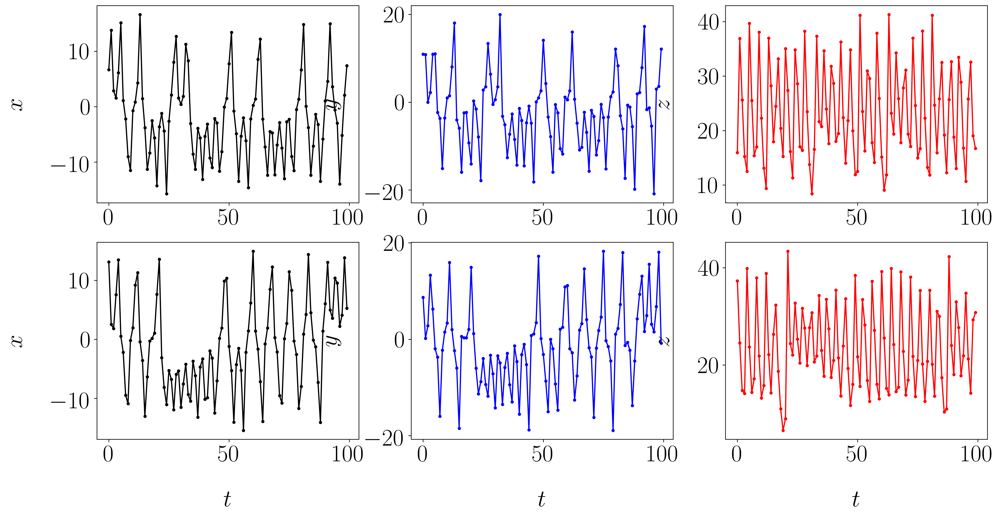

In [ ]:
fig=plt.figure(figsize=(20,10))
plt.subplot(231)
plt.plot(X_train[0,:,0],marker='.',color='black')
plt.xlabel(r'$t$')
plt.ylabel(r'$x$')
plt.subplot(232)
plt.plot(X_train[0,:,1],marker='.',color='blue')
plt.xlabel(r'$t$')
plt.ylabel(r'$y$')
plt.subplot(233)
plt.plot(X_train[0,:,2],marker='.',color='red')
plt.xlabel(r'$t$')
plt.ylabel(r'$z$')
plt.subplot(234)
plt.plot(X_train[1,:,0],marker='.',color='black')
plt.xlabel(r'$t$')
plt.ylabel(r'$x$')
plt.subplot(235)
plt.plot(X_train[1,:,1],marker='.',color='blue')
plt.xlabel(r'$t$')
plt.ylabel(r'$y$')
plt.subplot(236)
plt.plot(X_train[1,:,2],marker='.',color='red')
plt.xlabel(r'$t$')
plt.ylabel(r'$z$')
#plt.title("Solutions true et bruitée avec le nouvel échantillonage (dt=0.2 s)")
plt.savefig('/content/drive/MyDrive/Colab Notebooks/RINN-master/series_odeint_bruitee_ech_02.png',dpi=300)

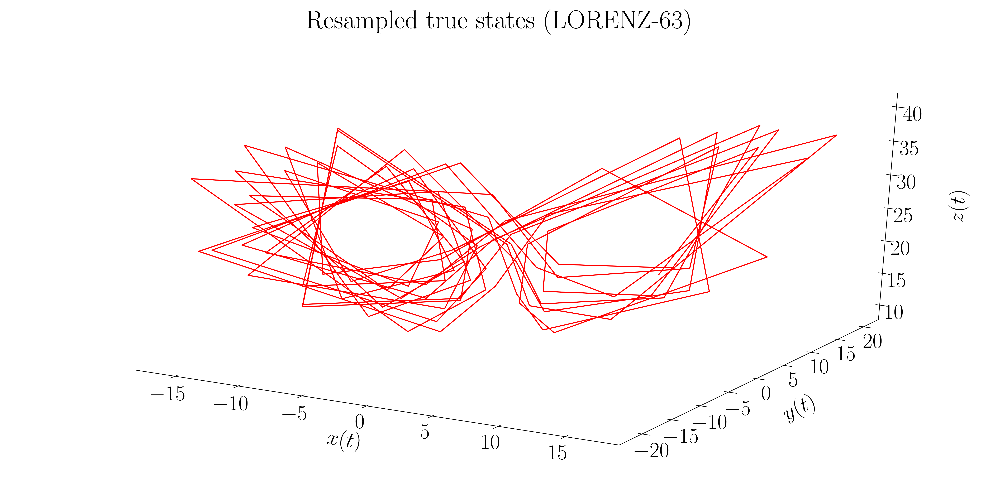

<Figure size 1800x1200 with 0 Axes>

In [ ]:
fig = plt.figure(figsize=(20,10))
ax = fig.gca(projection='3d')  # Affichage en 3D
ax.grid(False)
ax.w_xaxis.set_pane_color ((0., 0., 0., 0.))
ax.w_yaxis.set_pane_color ((0., 0., 0., 0.))
ax.w_zaxis.set_pane_color ((0., 0., 0., 0.))
ax.plot(X_train[0,:,0], X_train[0,:,1], X_train[0,:,2], label='Courbe',color='red')  # Tracé de la courbe 3D
plt.title("Resampled true states (LORENZ-63)")
ax.set_xlabel(r'$x(t)$')
ax.set_ylabel(r'$y(t)$')
ax.set_zlabel(r'$z(t)$')
plt.tight_layout()


plt.show()
plt.savefig('/content/drive/MyDrive/Colab Notebooks/RINN-master/bruit3d_ech_02.png',dpi=300)

In [ ]:
import pickle
data_dict = {}
data_dict['X_train'] = X_train
data_dict['Y_train'] = Y_train
data_dict['Grad_t']  = Grad_t
data_dict['X_test']  = xt.values
output = open('train_data_dt_02.pkl', 'wb')
pickle.dump(data_dict, output)
output.close()

In [ ]:


class GD2:
    model = 'Adv_Dif_1D_Real'
    class parameters:
        w = -0.5
        x0 = 0.5
        t0 = 0
    dt_integration =0.01# integration time
    dt_states = 1 # number of integeration times between consecutive states (for xt and catalog)
    dt_obs = 8# number of integration times between consecutive observations (for yo)
    var_obs = np.array([0]) # indices of the observed variables
    nb_loop_train = 1000.1 # size of the catalog
    nb_loop_test = 100 # size of the true state and noisy observations
    sigma2_catalog = 0.0 # variance of the model error to generate the catalog
    sigma2_obs = 2.0 # variance of the observation error to generate observation
    
# run the data generation
catalog2, xt2, yo2 = generate_data(GD2)
#AnDA_RMSE(catalog.true_solution,catalog.euler_integration)
#AnDA_RMSE(catalog.true_solution,catalog.num_integration)
#training data
batch_size_lin = catalog2.true_solution[:-10-1,:].shape[0]
X_train_lin = np.reshape(catalog2.true_solution[:-10-1,:],(int(catalog2.true_solution[1:-10,:].shape[0]/batch_size_lin),batch_size_lin,catalog2.true_solution[1:-10,:].shape[1]))
Grad_t_lin  = np.reshape(np.gradient(catalog2.true_solution[:-10-1,0])/GD.dt_integration,(X_train_lin.shape))
Y_train_lin = np.reshape(catalog2.true_solution[1:-10,:],(int(catalog2.true_solution[1:-10,:].shape[0]/batch_size_lin),batch_size_lin,catalog2.true_solution[1:-10,:].shape[1]))

Text(0, 0.5, '$x(t)$')

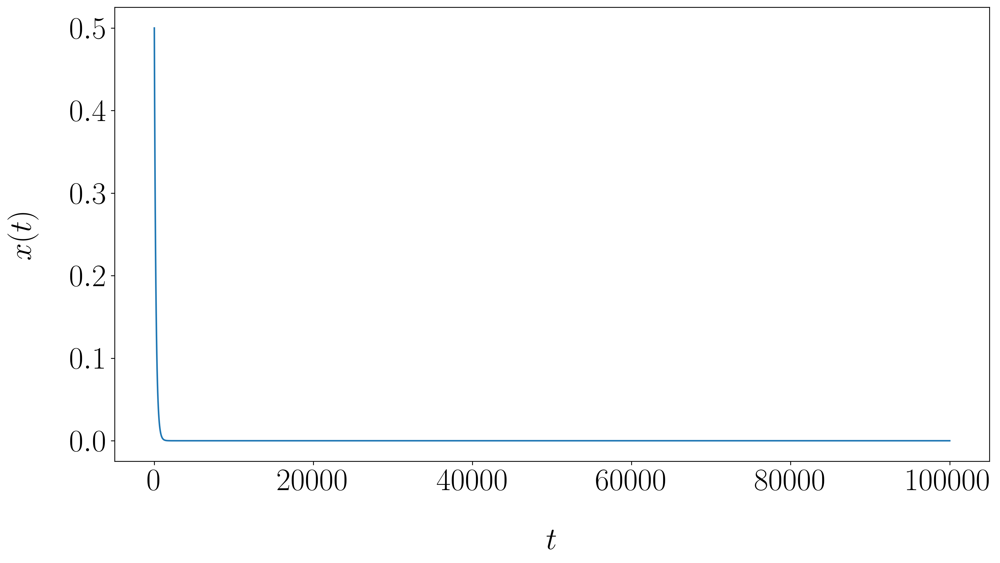

In [ ]:
plt.figure(figsize=(15,8))
plt.plot(X_train_lin[0,:,:])
plt.xlabel(r'$t$')
plt.ylabel(r'$x(t)$')

In [ ]:
# Number of stages
order=11 

device = 'cpu'

params = {}
params['transition_layers']=1
params['bi_linear_layers']=3
params['dim_hidden_linear'] = 3
params['dim_input']=3
params['dim_observations'] = 3
params['dim_output']=3
params['dim_hidden']=3
params['dt_integration']=GD.dt_integration
params['ntrain']=[0,2000]


params['lr']=0.001
pretrained = False
path = 'RINN_L63_dt_integration_02_order_11'

# Learn dynamical and integration models, stop when loss ~ 0.2

In [ ]:
np.random.seed(0)
torch.manual_seed(0)


class applyRK_Constraints(object):

        def __init__(self, frequency=1):
            self.frequency = frequency
    
        def __call__(self, module):

            
            if hasattr(module, 'b'):
                module.b.data = (torch.abs(module.b.data))
                module.b.data  =  ((module.b.data) / (module.b.data).sum(1,keepdim = True).expand_as(module.b.data))
            
            if hasattr(module, 'c'):
                module.c.data = module.c.data
                module.c.data[:,0] = 0
                module.c.data = module.c.data.sub_(torch.min(module.c.data)).div_(torch.max(module.c.data) - torch.min(module.c.data)).sort()[0]

########################################################################



class FC_net_true(torch.nn.Module):

        def __init__(self, params):
            super(FC_net_true, self).__init__()
        
        def forward(self, inp):
            """
            In the forward function we accept a Tensor of input data and we must return
            a Tensor of output data. We can use Modules defined in the constructor as
            well as arbitrary operators on Tensors.
            """
            arg = [GD.parameters.sigma,GD.parameters.rho,GD.parameters.beta]
            grad = Variable(torch.zeros((inp.size())))
            grad[:,0] = arg[0]*(inp[:,1]-inp[:,0]);
            grad[:,1] = inp[:,0]*(arg[1]-inp[:,2])-inp[:,1];
            grad[:,2] = inp[:,0]*inp[:,1] - arg[2]*inp[:,2];
#            dS  = np.array([x_1,x_2,x_3]);
#            grad = self.outputLayer(aug_vect)
            return grad


model_true  = FC_net_true(params)

########################################################################



class FC_net_true_L96(torch.nn.Module):
        def __init__(self, params):
            super(FC_net_true_L96, self).__init__()

        def forward(self, S):
            """
            In the forward function we accept a Tensor of input data and we must return
            a Tensor of output data. We can use Modules defined in the constructor as
            well as arbitrary operators on Tensors.
            """
            J = 40
            F = 8
            x = torch.zeros(S.shape[0],J).to(device);
            x[:,0] = (S[:,1]-S[:,J-2])*S[:,J-1]-S[:,0];
            x[:,1] = (S[:,2]-S[:,J-1])*S[:,0]-S[:,1];
            x[:,J-1] = (S[:,0]-S[:,J-3])*S[:,J-2]-S[:,J-1];
            for j in range(2,J-1):
                x[:,j] = (S[:,j+1]-S[:,j-2])*S[:,j-1]-S[:,j];
            dS = x + F;
#            dS  = np.array([x_1,x_2,x_3]);
#            grad = self.outputLayer(aug_vect)
            return dS


model_true_L96  = FC_net_true_L96(params).to(device)


########################################################################


class FC_net(torch.nn.Module):

  
        def __init__(self, params):

           
            super(FC_net, self).__init__()

          
            self.linearCell   = torch.nn.Linear(params['dim_input'], params['dim_hidden_linear']).to(device) 
            
            
            self.BlinearCell1 = torch.nn.ModuleList([torch.nn.Linear(params['dim_input'], 1).to(device) for i in range(params['bi_linear_layers'])])
            self.BlinearCell2 = torch.nn.ModuleList([torch.nn.Linear(params['dim_input'], 1).to(device) for i in range(params['bi_linear_layers'])])
            
            augmented_size    = params['bi_linear_layers'] + params['dim_hidden_linear']
            
           
            self.transLayers = torch.nn.ModuleList([torch.nn.Linear(augmented_size, params['dim_output']).to(device)])
            self.transLayers.extend([torch.nn.Linear(params['dim_output'], params['dim_output']).to(device) for i in range(1, params['transition_layers'])])
            
         
            self.outputLayer  = torch.nn.Linear(params['dim_output'], params['dim_output']).to(device)
        
        
        def forward(self, inp):
            """
            In the forward function we accept a Tensor of input data and we must return
            a Tensor of output data. We can use Modules defined in the constructor as
            well as arbitrary operators on Tensors.
            """
            BP_outp = Variable(torch.zeros((inp.size()[0],params['bi_linear_layers'])).to(device))
            
   
            L_outp   = self.linearCell(inp)

      
            for i in range((params['bi_linear_layers'])):
                BP_outp[:,i]=self.BlinearCell1[i](inp)[:,0]*self.BlinearCell2[i](inp)[:,0]
            
            aug_vect = torch.cat((L_outp, BP_outp), dim=1)
         
            for i in range((params['transition_layers'])):
                aug_vect = (self.transLayers[i](aug_vect))
            
     
            grad = self.outputLayer(aug_vect)
            return grad

model  = FC_net(params).to(device)

########################################################################


class FC_net_lin(torch.nn.Module):
        def __init__(self, params):
            super(FC_net_lin, self).__init__()
            self.coef_mdl =GD2.parameters.w
        def forward(self, inp):
            """
            In the forward function we accept a Tensor of input data and we must return
            a Tensor of output data. We can use Modules defined in the constructor as
            well as arbitrary operators on Tensors.
            """
            grad = self.coef_mdl*inp
            return grad

# Instanciation
model_lin  = FC_net_lin(params).to(device)

########################################################################



class INT_net(torch.nn.Module):
        
       
        def __init__(self, params,order):
            super(INT_net, self).__init__()
            self.Dyn_net = model
            self.Dyn_net_lin = model_lin
            self.Dyn_net_True = model_true.to(device)
            self.Dyn_net_True_L96 = model_true_L96.to(device)


           
            a = 0.*np.tril(np.random.uniform(size=(1,order,order)),k=-1)
            b = 0.*np.random.uniform(size=(1,order))
            c = 0.01*np.random.uniform(size=(1,order))
            
          
            self.a = torch.nn.Parameter(torch.from_numpy(a[:,:,:]).float().to(device),requires_grad = True).to(device)
            self.b = torch.nn.Parameter(torch.from_numpy(b).float().to(device),requires_grad = True).to(device)
            self.c = torch.nn.Parameter(torch.from_numpy(c).float().to(device),requires_grad = True).to(device)
        
        
        
        
        
        def lin_flow(self, inp, dt, order):
            """
            In the forward function we accept a Tensor of input data and we must return
            a Tensor of output data. We can use Modules defined in the constructor as
            well as arbitrary operators on Tensors.
            """
            k = [(self.Dyn_net_lin(inp))]
            for i in range(1,order):
                coef_sum = torch.autograd.Variable(torch.zeros(k[0].size()).to(device))
                for j in range(0,i):
                    if j ==0:
                        if i == 1:
                            coef_sum = coef_sum + k[j]*(self.c[:,i]).expand_as(k[j])
                        else:
                            coef_sum = coef_sum + k[j]*(self.c[:,i]-self.a[:,i,1:i].sum(1)).expand_as(k[j])
                    else :
                        coef_sum = coef_sum + k[j]*self.a[:,i,j].expand_as(k[j])
                rk_inp = inp+dt*coef_sum        
                k.append(self.Dyn_net_lin(rk_inp))
            
            
            pred_sum = torch.autograd.Variable(torch.zeros(k[0].size()).to(device))
            for i in range(0,order): 
                pred_sum = pred_sum+k[i]*self.b[:,i].expand_as(k[i])
            pred = inp +dt*pred_sum
            gain = pred[0,:]/(inp[0,:])
            return pred ,k[0], gain 
        
        def flow_True_Model(self, inp, dt, order):
            """
            In the forward function we accept a Tensor of input data and we must return
            a Tensor of output data. We can use Modules defined in the constructor as
            well as arbitrary operators on Tensors.
            """
            k = [(self.Dyn_net_True(inp))]
            for i in range(1,order):
                coef_sum = torch.autograd.Variable(torch.zeros(k[0].size()).to(device))
                for j in range(0,i):
                    if j ==0:
                        if i == 1:
                            coef_sum = coef_sum + k[j]*(self.c[:,i]).expand_as(k[j])
                        else:
                            coef_sum = coef_sum + k[j]*(self.c[:,i]-self.a[:,i,1:i].sum(1)).expand_as(k[j])
                    else :
                        coef_sum = coef_sum + k[j]*self.a[:,i,j].expand_as(k[j])
                rk_inp = inp+dt*coef_sum        
                k.append(self.Dyn_net_True(rk_inp))
            pred_sum = torch.autograd.Variable(torch.zeros(k[0].size()).to(device))
            for i in range(0,order): 
                pred_sum = pred_sum+k[i]*self.b[:,i].expand_as(k[i])
            pred = inp +dt*pred_sum
            return pred ,k[0], inp
        
        def flow_True_Model_L96(self, inp, dt, order):
            """
            In the forward function we accept a Tensor of input data and we must return
            a Tensor of output data. We can use Modules defined in the constructor as
            well as arbitrary operators on Tensors.
            """
            k = [(self.Dyn_net_True_L96(inp))]
            for i in range(1,order):
                coef_sum = torch.autograd.Variable(torch.zeros(k[0].size()).to(device))
                for j in range(0,i):
                    if j ==0:
                        if i == 1:
                            coef_sum = coef_sum + k[j]*(self.c[:,i]).expand_as(k[j])
                        else:
                            coef_sum = coef_sum + k[j]*(self.c[:,i]-self.a[:,i,1:i].sum(1)).expand_as(k[j])
                    else :
                        coef_sum = coef_sum + k[j]*self.a[:,i,j].expand_as(k[j])
                rk_inp = inp+dt*coef_sum        
                k.append(self.Dyn_net_True_L96(rk_inp))
            pred_sum = torch.autograd.Variable(torch.zeros(k[0].size()).to(device))
            for i in range(0,order): 
                pred_sum = pred_sum+k[i]*self.b[:,i].expand_as(k[i])
            pred = inp +dt*pred_sum
            return pred ,k[0], inp        
        
        def flow_RK45_True_Model(self, inp,dt,order = 4):
            k1    = self.Dyn_net_True(inp)
            inp_k2 = inp + 0.5*dt*k1
            k2  = self.Dyn_net_True(inp_k2)
            inp_k3 = inp + 0.5*dt*k2       
            k3   = self.Dyn_net_True(inp_k3)
            inp_k4 = inp + dt*k3          
            k4   = self.Dyn_net_True(inp_k4)            
            pred = inp +dt*(k1+2*k2+2*k3+k4)/6    
            return pred, k1     
        
        def flow_RK45_True_Model_L96(self, inp,dt,order = 4):
            k1    = self.Dyn_net_True_L96(inp)
            inp_k2 = inp + 0.5*dt*k1
            k2  = self.Dyn_net_True_L96(inp_k2)
            inp_k3 = inp + 0.5*dt*k2       
            k3   = self.Dyn_net_True_L96(inp_k3)
            inp_k4 = inp + dt*k3          
            k4   = self.Dyn_net_True_L96(inp_k4)            
            pred = inp +dt*(k1+2*k2+2*k3+k4)/6    
            return pred, k1    
        
        def flow_RK45(self, inp,dt,order = 4):
            k1    = self.Dyn_net(inp)
            inp_k2 = inp + 0.5*dt*k1
            k2  = self.Dyn_net(inp_k2)
            inp_k3 = inp + 0.5*dt*k2       
            k3   = self.Dyn_net(inp_k3)
            inp_k4 = inp + dt*k3          
            k4   = self.Dyn_net(inp_k4)            
            pred = inp +dt*(k1+2*k2+2*k3+k4)/6    
            return pred, k1        
        
        def opti_gain_lin(self, h_int, inp, order):
            gain = Variable(torch.zeros(h_int.size()).float().to(device))
            for i in range(h_int.shape[0]):
                pred ,tmp, tmpp =self.lin_flow(inp, h_int[i], order)
                gain[i] = tmpp[0]
                del pred, tmp, tmpp
            return gain
        
        def implicit_scheme(self, inp, inpt1, dt, order):
            """
            In the forward function we accept a Tensor of input data and we must return
            a Tensor of output data. We can use Modules defined in the constructor as
            well as arbitrary operators on Tensors.
            """
            k = [(self.Dyn_net(inpt1))]
            for i in range(1,order):
                coef_sum = torch.autograd.Variable(torch.zeros(k[0].size()).to(device))
                for j in range(0,i):
                    if j ==0:
                        if i == 1:
                            coef_sum = coef_sum + k[j]*(self.c[:,i]).expand_as(k[j])
                        else:
                            coef_sum = coef_sum + k[j]*(self.c[:,i]-self.a[:,i,1:i].sum(1)).expand_as(k[j])
                    else :
                        coef_sum = coef_sum + k[j]*self.a[:,i,j].expand_as(k[j])
                rk_inp = inp+dt*coef_sum        
                k.append(self.Dyn_net(rk_inp))
            pred_sum = torch.autograd.Variable(torch.zeros(k[0].size()).to(device))
            for i in range(0,order): 
                pred_sum = pred_sum+k[i]*self.b[:,i].expand_as(k[i])
            pred = inp +dt*pred_sum
            return pred ,k[0], inp        
        
        def forward(self, inp, dt, order):
            """
            In the forward function we accept a Tensor of input data and we must return
            a Tensor of output data. We can use Modules defined in the constructor as
            well as arbitrary operators on Tensors.
            """
            k = [(self.Dyn_net(inp))]
            
           
            for i in range(1,order):
                
               
                coef_sum = torch.autograd.Variable(torch.zeros(k[0].size()).to(device))
                
               
                for j in range(0,i):
                    
              
                    if j ==0:
                        
                        
                        if i == 1:
                            coef_sum = coef_sum + k[j]*(self.c[:,i]).expand_as(k[j])
                        
                        
                        else:
                            coef_sum = coef_sum + k[j]*(self.c[:,i]-self.a[:,i,1:i].sum(1)).expand_as(k[j])
                    
                    
                    else :
                        coef_sum = coef_sum + k[j]*self.a[:,i,j].expand_as(k[j])
                
                
                rk_inp = inp+dt*coef_sum        
                
                k.append(self.Dyn_net(rk_inp))
           
            pred_sum = torch.autograd.Variable(torch.zeros(k[0].size()).to(device))
            
            for i in range(0,order): 
                pred_sum = pred_sum+k[i]*self.b[:,i].expand_as(k[i])
           
            pred = inp +dt*pred_sum
            
            return pred ,k[0], inp

In [ ]:
x = Variable(torch.from_numpy(X_train).float().to(device))
y = Variable(torch.from_numpy(Y_train).float().to(device))
z = Variable(torch.from_numpy(Grad_t).float().to(device))

# Construct our model by instantiating the class defined above
    
modelRINN = INT_net(params,order)

# Construct our loss function and an Optimizer. The call to model.parameters()

pretrained=False
if pretrained :
        modelRINN.load_state_dict(torch.load('/content/drive/MyDrive/Colab Notebooks/RINN-master/Lorenz_63/RINN_L63_dt_integration_02_order_11.pt'))
criterion = torch.nn.MSELoss()
optimizer = torch.optim.Adam(modelRINN.parameters(), lr = 0.001)

In [ ]:
#modelRINN.load_state_dict(torch.load('RINN_L63_dt' + str(GD.dt_integration)+ '.pt'))

In [ ]:
print ('Learning dynamical model')
for t in range(params['ntrain'][0]):
        for b in range(x.shape[0]):
            # Forward pass: Compute predicted gradients by passing x to the model
            pred ,grad , inp = modelRINN(x[b,:,:],params['dt_integration'],order)
            # Compute and print loss
            loss = criterion(grad, z[b,:,:])
            # Zero gradients, perform a backward pass, and update the weights.
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
        print(t,loss)

Learning dynamical model


In [ ]:

clipper = applyRK_Constraints()
clip_value = 1.0

print(x.shape[0])
print ('Learning dynamical model')


for t in range(params['ntrain'][1]):
        
        for b in range(x.shape[0]):
            # Forward pass: Compute predicted gradients by passing x to the model
            pred ,grad , inp = modelRINN(x[b,:,:],params['dt_integration'],order)
            # Compute and print loss
            loss = criterion(pred, y[b,:,:])
            
            
            if not False:
                # Zero gradients, perform a backward pass, and update the weights.
                optimizer.zero_grad() 
                loss.backward()
                optimizer.step()
                torch.nn.utils.clip_grad_norm_(modelRINN.parameters(),5)
                torch.save(modelRINN.state_dict(), path+'.pt')
                if t % clipper.frequency == 0:
                    modelRINN.apply(clipper)
            print(t,loss.detach().numpy())
        if t > 300:
            for param_group in optimizer.param_groups:
                param_group['lr'] = 0.0001

200
Learning dynamical model
0 108.06302
0 149.33913
0 145.26534
0 121.823296
0 151.11794
0 133.90895
0 143.41446
0 135.46173
0 145.4912
0 139.83366
0 155.01392
0 141.8478
0 143.83028
0 125.65496
0 148.0383
0 139.12726
0 151.0014
0 142.50266
0 140.7369
0 135.28749
0 117.45075
0 133.93404
0 117.75383
0 131.74498
0 130.7973
0 136.35234
0 93.14979
0 111.56431
0 112.58854
0 133.5352
0 125.70324
0 108.83091
0 124.83867
0 119.830444
0 129.86285
0 120.48974
0 121.38841
0 127.62329
0 119.249504
0 122.85123
0 100.920815
0 124.50282
0 90.167175
0 115.14857
0 113.20239
0 127.21333
0 115.39418
0 102.14952
0 117.781624
0 96.386536
0 105.30844
0 109.83078
0 104.347046
0 110.84528
0 109.36724
0 118.79623
0 107.357635
0 110.61433
0 113.459404
0 104.86271
0 103.68203
0 115.61651
0 109.35998
0 101.991295
0 107.560974
0 96.24763
0 88.28636
0 116.959946
0 109.09895
0 96.10072
0 97.77261
0 104.41724
0 95.43872
0 109.48955
0 96.07148
0 88.6545
0 99.795364
0 110.39114
0 100.519066
0 104.42352
0 107.17206
0 1

KeyboardInterrupt: ignored

# Short term forecast 

In [ ]:
nb_steps_pred = 1000
t_pred = nb_steps_pred * GD.dt_integration
y_pred_init=np.zeros((nb_steps_pred,params['dim_output']))
tmp = np.reshape(xt.values[0,:],(1,params['dim_output']))
tmp = Variable(torch.from_numpy(tmp).float())
y_pred_init[0,:] = xt.values[0,:]
for i in range(1,nb_steps_pred):
    y_pred_init[i,:] = modelRINN(tmp,params['dt_integration'],order)[0].data.numpy()
    tmp = Variable(torch.from_numpy(np.reshape(y_pred_init[i,:] ,(1,params['dim_output']))).float())

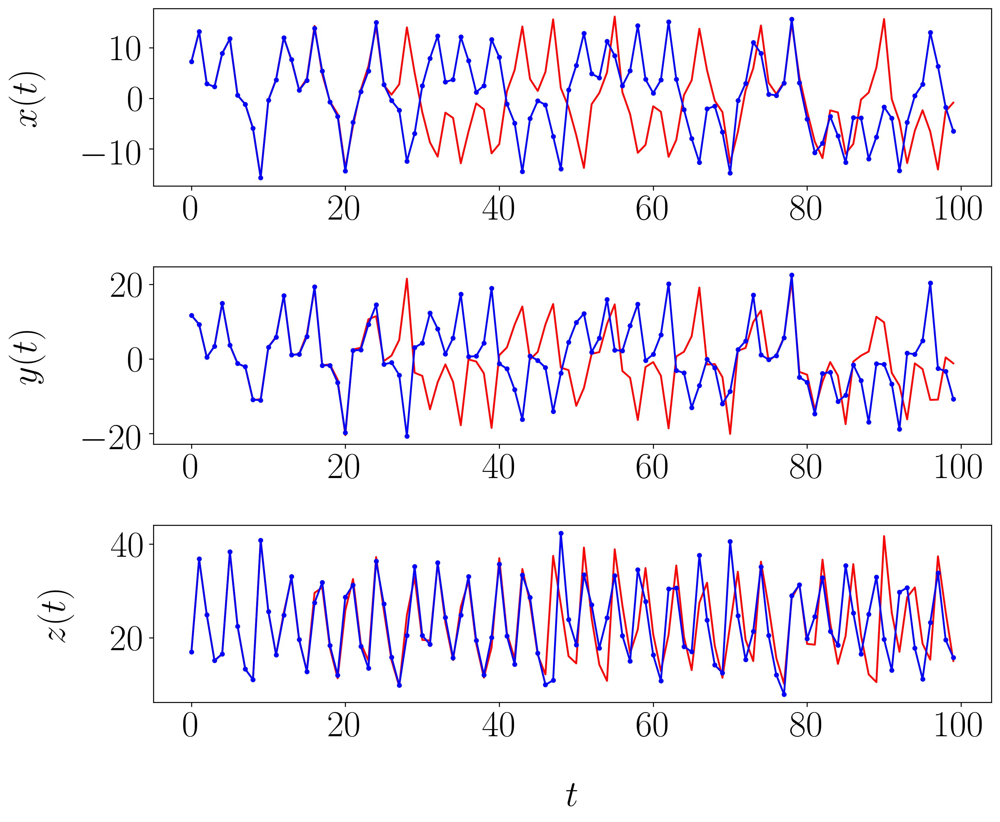

In [ ]:
plt.figure(figsize=(12,10))
plt.title('True states vs. prediction')

plt.subplot(311)
plt.plot(xt.values[:100,0],color='red')
plt.plot(y_pred_init[:100,0],marker='.',color='blue')
plt.ylabel(r'$x(t)$')
plt.subplot(312)
plt.plot(xt.values[:100,1],color='red')
plt.plot(y_pred_init[:100,1],marker='.',color='blue')
plt.ylabel(r'$y(t)$')
plt.subplot(313)
plt.plot(xt.values[:100,2],color='red')
plt.plot(y_pred_init[:100,2],marker='.',color='blue')
plt.ylabel(r'$z(t)$')
plt.xlabel(r'$t$')
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/Colab Notebooks/RINN-master/forecast.png',dpi=300)

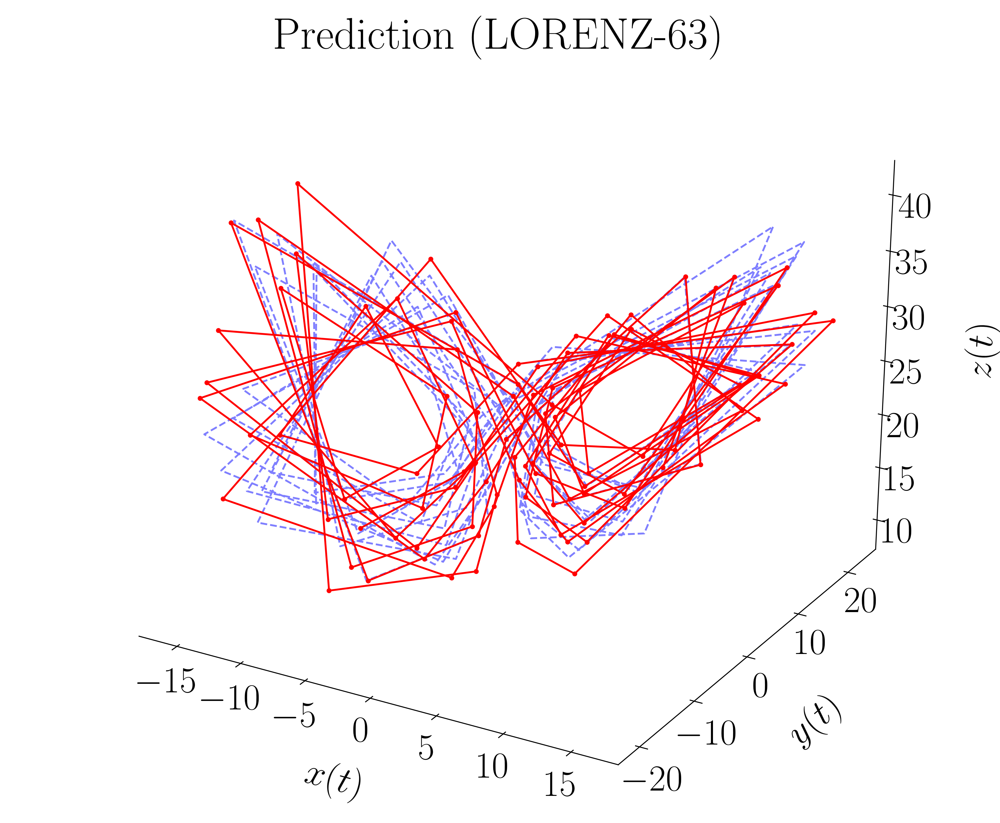

In [ ]:




fig=plt.figure(figsize=(12,10))
ax = fig.gca(projection='3d')  # Affichage en 3D
ax.grid(False)
ax.w_xaxis.set_pane_color ((0., 0., 0., 0.))
ax.w_yaxis.set_pane_color ((0., 0., 0., 0.))
ax.w_zaxis.set_pane_color ((0., 0., 0., 0.))
ax.plot(xt.values[:100,0], xt.values[:100,1], xt.values[:100,2], label='Courbe',color='blue',alpha=0.5,linestyle='--')  # Tracé de la courbe 3D
ax.plot(y_pred_init[:100,0], y_pred_init[:100,1], y_pred_init[:100,2], label='Courbe',color='red',marker='.')  # Tracé de la courbe 3D

plt.title("Prediction (LORENZ-63)")
ax.set_xlabel(r'$x(t)$')
ax.set_ylabel(r'$y(t)$')
ax.set_zlabel(r'$z(t)$')
plt.tight_layout()

plt.tight_layout()
plt.savefig('/content/drive/MyDrive/Colab Notebooks/RINN-master/forecast3d.png',dpi=300)



In [ ]:
print('RMSE t+dt : ',RMSE(xt.values[1,:],y_pred_init[1,:]))
print('RMSE t+4dt : ',RMSE(xt.values[4,:],y_pred_init[4,:]))

RMSE t+dt :  0.006985652854399565
RMSE t+4dt :  0.03674138205407331


## Perfs of the trained model and integration scheme


In [ ]:
#extracting integration scheme params
a=modelRINN.a.clone().data.numpy()
b=modelRINN.b.clone().data.numpy()
c=modelRINN.c.clone().data.numpy()


import pickle

#with open('/content/drive/MyDrive/Colab Notebooks/RINN-master/Lorenz_63/LearnedParameters/a1', 'wb') as f1:
     #pickle.dump(modelRINN.a, f1)
#with open('/content/drive/MyDrive/Colab Notebooks/RINN-master/Lorenz_63/LearnedParameters/b1', 'wb') as f2:
     #pickle.dump(modelRINN.b, f2)
#with open('/content/drive/MyDrive/Colab Notebooks/RINN-master/Lorenz_63/LearnedParameters/c1', 'wb') as f3:
     #pickle.dump(modelRINN.c, f3)

#with open('/content/drive/MyDrive/Colab Notebooks/RINN-master/Lorenz_63/LearnedParameters/a', 'rb') as f4:
    #OL = pickle.load(f4)
#print(OL)

#with open('/content/drive/MyDrive/Colab Notebooks/RINN-master/Lorenz_63/LearnedParameters/a', 'rb') as f1:
    #a=pickle.load( f1)
#with open('/content/drive/MyDrive/Colab Notebooks/RINN-master/Lorenz_63/LearnedParameters/b', 'rb') as f2:
    #b=pickle.load(f2)
#with open('/content/drive/MyDrive/Colab Notebooks/RINN-master/Lorenz_63/LearnedParameters/c', 'rb') as f3:
    #c=pickle.load(f3)

In [ ]:
import sympy as sp
xt, h,g = sp.symbols('xt h g')

In [ ]:
# computing analytic form of the integration scheme
k = [(modelRINN.Dyn_net_lin(xt))]
for i in range(1,order):
    coef_sum = 0
    for j in range(0,i):
        if j ==0:
            if i == 1:
                coef_sum = coef_sum + k[j]*(c[:,i])
            else:
                coef_sum = coef_sum + k[j]*(c[:,i]-a[:,i,1:i].sum(1))
        else :
            coef_sum = coef_sum + k[j]*a[:,i,j]
    rk_inp = xt+h*coef_sum        
    k.append((modelRINN.Dyn_net_lin(rk_inp)))
#            pred_sum = torch.autograd.Variable(torch.zeros(k[0].size()).double())
pred_sum = 0   
for i in range(0,order): 
    pred_sum = pred_sum+k[i]*b[:,i]
    xt_1 = sp.Add(xt+h*np.asscalar(pred_sum))
# extracting the gain factor
g = xt_1.factor(xt)/xt


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: DeprecationWarning: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead


AttributeError: ignored

In [ ]:
# RK4 analytic integration scheme
grad = modelRINN.Dyn_net_lin(xt)
k1   = modelRINN.Dyn_net_lin(xt)
k2   = modelRINN.Dyn_net_lin(xt+0.5*h*k1)
k3   = modelRINN.Dyn_net_lin(xt+0.5*h*k2)
k4   = modelRINN.Dyn_net_lin(xt+h*k3)            
xt_1RK4 = xt +h*(k1+2*k2+2*k3+k4)/6

gRK4 = xt_1RK4.factor(xt)/xt

In [ ]:
# stability graph
hi = np.arange(0,20+0.000001,0.01)
gainRK4 = np.zeros_like(hi)
for i in range(len(hi)):
    gainRK4[i] = np.abs(gRK4.evalf(subs={h: hi[i]}))
gainE = np.zeros_like(hi)
for i in range(len(hi)):
    gainE[i] = np.abs(1-0.5*hi[i])
gain = np.zeros_like(hi)
for i in range(len(hi)):
    print(g.evalf(subs={h:hi[i]}))
    gain[i] = g.evalf(subs={h: hi[i]})

In [ ]:
length_h = hi.shape[0]
import matplotlib as mpl
mpl.rcParams['figure.dpi']=300
plt.rcParams["mathtext.fontset"] = "cm"
import matplotlib.pyplot as plt
plt.rcParams.update({'font.size': 42})
plt.rcParams.update({
    "text.usetex": True,
    "font.family": "sans-serif",
    "font.sans-serif": ["Helvetica"]})
## for Palatino and other serif fonts use:
plt.rcParams.update({
    "text.usetex": True,
    "font.family": "serif",
    "font.serif": ["Palatino"],
})
plt.figure(figsize=(20,20))
plt.plot(hi[:(length_h-1200)]*0.5,gainE[:(length_h-1200)],label = 'Euler',lw = 3)
plt.plot(hi[:length_h]*0.5,gain[:length_h],label = 'RINN 11',lw = 3)
plt.plot(hi[:(length_h-1200)]*0.5,gainRK4[:(length_h-1200)],label = 'Runge Kutta 4',lw = 3)
plt.plot(hi[:length_h]*0.5,np.ones_like(gainRK4[:length_h]),lw = 3)
#plt.plot(hi[:600],np.abs(ff[-1].data.numpy()[:600]))
plt.xlabel('$h\lambda$')
plt.ylabel('$R(h\lambda)$')
plt.grid()
plt.legend()
plt.savefig('/content/drive/MyDrive/Colab Notebooks/RINN-master/stability1D.png')
plt.show()

In [ ]:
modelRINN.b.sum() # RK constraint respected :)

tensor(1., grad_fn=<SumBackward0>)

In [ ]:
# computing analytic form of the integration scheme
a=modelRINN.a.clone().data.numpy()
b=modelRINN.b.clone().data.numpy()
c=modelRINN.c.clone().data.numpy()
xt, h, lam = sp.symbols('xt h \lambda')
k = [lam*xt]
for i in range(1,order):
    coef_sum = 0
    for j in range(0,i):
        if j ==0:
            if i == 1:
                coef_sum = coef_sum + k[j]*(c[:,i])
            else:
                coef_sum = coef_sum + k[j]*(c[:,i]-a[:,i,1:i].sum(1))
        else :
            coef_sum = coef_sum + k[j]*a[:,i,j]
    rk_inp = xt+h*coef_sum        
    k.append((lam*(rk_inp)))
#            pred_sum = torch.autograd.Variable(torch.zeros(k[0].size()).double())
pred_sum = 0   
for i in range(0,order): 
    pred_sum = pred_sum+k[i]*b[:,i]
    xt_1 = xt +h*pred_sum
# extracting the gain factor
g = xt_1.factor(xt)/xt

AttributeError: ignored

In [ ]:
g

# Perfs 2D

In [ ]:
# generating training data : lambda complexe
class GD:
    model = 'Adv_Dif_1D'
    class parameters:
        w = -0.1+1.0j
        x0 = 0.5+0.5j
        t0 = 0
    dt_integration =0.01# integration time
    dt_states = 1 # number of integeration times between consecutive states (for xt and catalog)
    dt_obs = 8# number of integration times between consecutive observations (for yo)
    var_obs = np.array([0]) # indices of the observed variables
    nb_loop_train = 60.1 # size of the catalog
    nb_loop_test = 100 # size of the true state and noisy observations
    sigma2_catalog = 0.0 # variance of the model error to generate the catalog
    sigma2_obs = 2.0 # variance of the observation error to generate observation
    
# run the data generation
catalog, xt, yo = generate_data(GD)
#training data
batch_size = catalog.true_solution[:-10-1,:].shape[0]
X_train_r = np.reshape(catalog.true_solution.real[:-10-1,:],(int(catalog.true_solution[1:-10,:].shape[0]/batch_size),batch_size,catalog.true_solution[1:-10,:].shape[1]))
X_train_i = np.reshape(catalog.true_solution.imag[:-10-1,:],(int(catalog.true_solution[1:-10,:].shape[0]/batch_size),batch_size,catalog.true_solution[1:-10,:].shape[1]))
Y_train_r = np.reshape(catalog.true_solution.real[1:-10,:],(int(catalog.true_solution[1:-10,:].shape[0]/batch_size),batch_size,catalog.true_solution[1:-10,:].shape[1]))
Y_train_i = np.reshape(catalog.true_solution.imag[1:-10,:],(int(catalog.true_solution[1:-10,:].shape[0]/batch_size),batch_size,catalog.true_solution[1:-10,:].shape[1]))

In [ ]:
#extracting integration scheme params
#a=modelRINN.a.clone().data.numpy()[0,:,:]
#b=modelRINN.b.clone().data.numpy()[0,:]
#c=modelRINN.c.clone().data.numpy()[0,:]
a=a.clone().data.numpy()[0,:,:]
b=b.clone().data.numpy()[0,:]
c=c.clone().data.numpy()[0,:]
a[:,0] = c[:] - a[:,:].sum(axis = 1)

import sympy as sp
x1,re_w,h  = sp.symbols('x1 re_w h',real=True)
x2,im_w    = sp.symbols('x2 im_w',real=True)

xt   = sp.symbols('x1+ix2')
lamb = re_w+sp.I*im_w

In [ ]:
rz = np.arange(-10,10+0.000001,0.01)
iz = np.arange(-10,10+0.000001,0.01)
rz, iz = np.meshgrid(rz,iz)
z  = rz+iz*1.j



In [ ]:
GRINN = np.zeros_like(z)*np.nan
list_g = []
list_x = []
list_y = []
for i in tqdm(range(z.shape[0])):
    for j in range(z.shape[1]):
        tmp = np.abs(1+z[i,j]*np.dot(np.dot(b.T,np.linalg.inv(np.eye(a.shape[0])-z[i,j]*a)),np.ones_like(b)))
        if tmp<1:
          
            GRINN[i,j] = np.abs(1+z[i,j]*np.dot(np.dot(b.T,np.linalg.inv(np.eye(a.shape[0])-z[i,j]*a)),np.ones_like(b)))
            list_g.append(GRINN[i,j].real)
            list_x.append(z[i,j].real)
            list_y.append(z[i,j].imag)

100%|██████████| 2001/2001 [05:44<00:00,  5.81it/s]


In [ ]:
GE = np.zeros_like(z)*np.nan
list_gE = []
list_xE = []
list_yE = []
for i in tqdm(range(z.shape[0])):
    for j in range(z.shape[1]):
        tmp = np.abs(1+z[i,j])
        if tmp<1:
            GE[i,j] = tmp
            list_gE.append(GE[i,j].real)
            list_xE.append(z[i,j].real)
            list_yE.append(z[i,j].imag)

100%|██████████| 2001/2001 [00:11<00:00, 175.12it/s]


In [ ]:
GRK4 = np.zeros_like(z)*np.nan
ark4 = np.array([[0,0,0,0],[1/2,0,0,0],[0,1/2,0,0],[0,0,1,0]])
brk4 = np.array([1/6,1/3,1/3,1/6])

list_gRK4 = []
list_xRK4 = []
list_yRK4 = []
for i in tqdm(range(z.shape[0])):
    for j in range(z.shape[1]):
        tmp = np.abs(1+z[i,j]*np.dot(np.dot(brk4.T,np.linalg.inv(np.eye(ark4.shape[0])-z[i,j]*ark4)),np.ones_like(brk4)))
        if tmp<1:
            GRK4[i,j] = tmp
            list_gRK4.append(GRK4[i,j].real)
            list_xRK4.append(z[i,j].real)
            list_yRK4.append(z[i,j].imag)

100%|██████████| 2001/2001 [04:05<00:00,  8.15it/s]


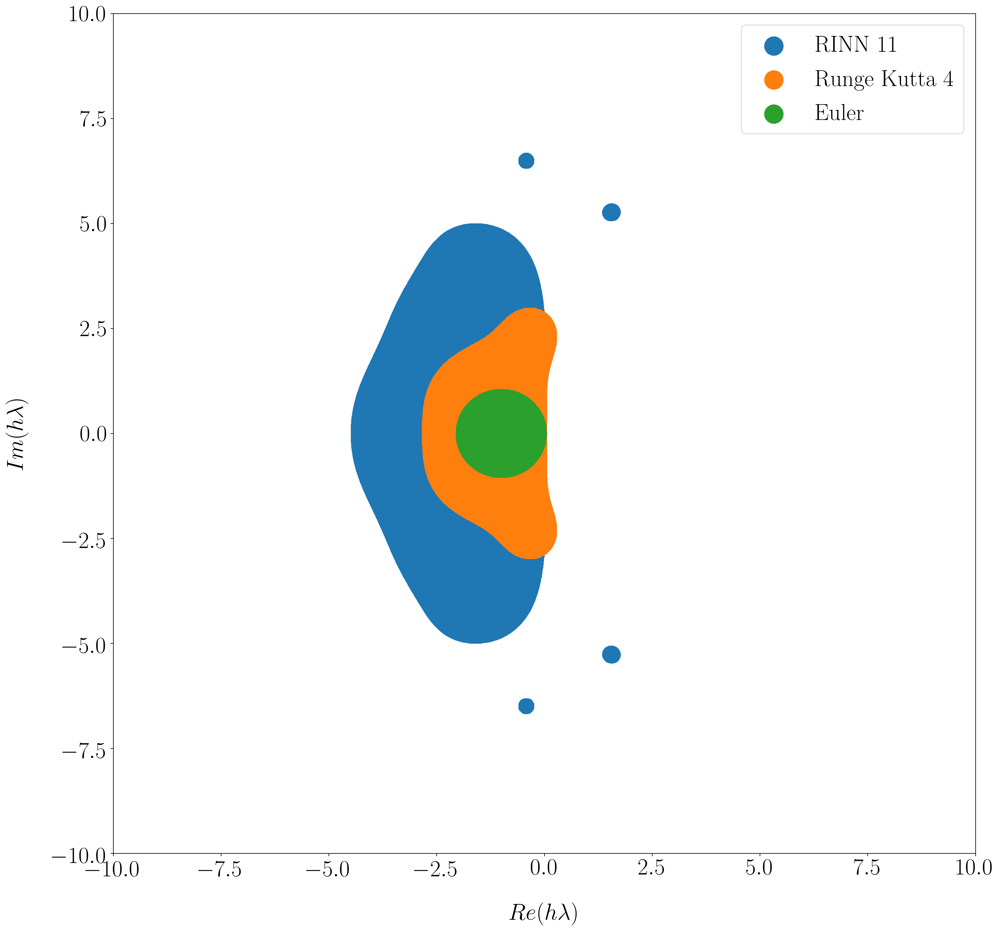

In [ ]:
import numpy as np
from tqdm import tqdm
length_h = 1000
import matplotlib as mpl
import matplotlib.pyplot as plt
plt.rcParams["mathtext.fontset"] = "cm"
import matplotlib.pyplot as plt
plt.rcParams.update({'font.size': 30})
plt.rcParams.update({
    "text.usetex": True,
    "font.family": "sans-serif",
    "font.sans-serif": ["Helvetica"]})
## for Palatino and other serif fonts use:
plt.rcParams.update({
    "text.usetex": True,
    "font.family": "serif",
     "font.sans-serif": ["Helvetica"]})
plt.rcParams['axes.titlepad'] = 20 

plt.figure(figsize=(20,20))

plt.scatter(np.array(list_x),np.array(list_y), label = 'RINN 11')
plt.scatter(np.array(list_xRK4),np.array(list_yRK4), label = 'Runge Kutta 4')
plt.scatter(np.array(list_xE),np.array(list_yE), label = 'Euler')
plt.legend(markerscale=4.)
plt.xlabel(r'$Re(h\lambda)$')
plt.ylabel(r'$Im(h\lambda)$')
plt.xlim(-10,10)
plt.ylim(-10,10)
plt.savefig('/content/drive/MyDrive/Colab Notebooks/RINN-master/stability2D.png')

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order, subok=True)


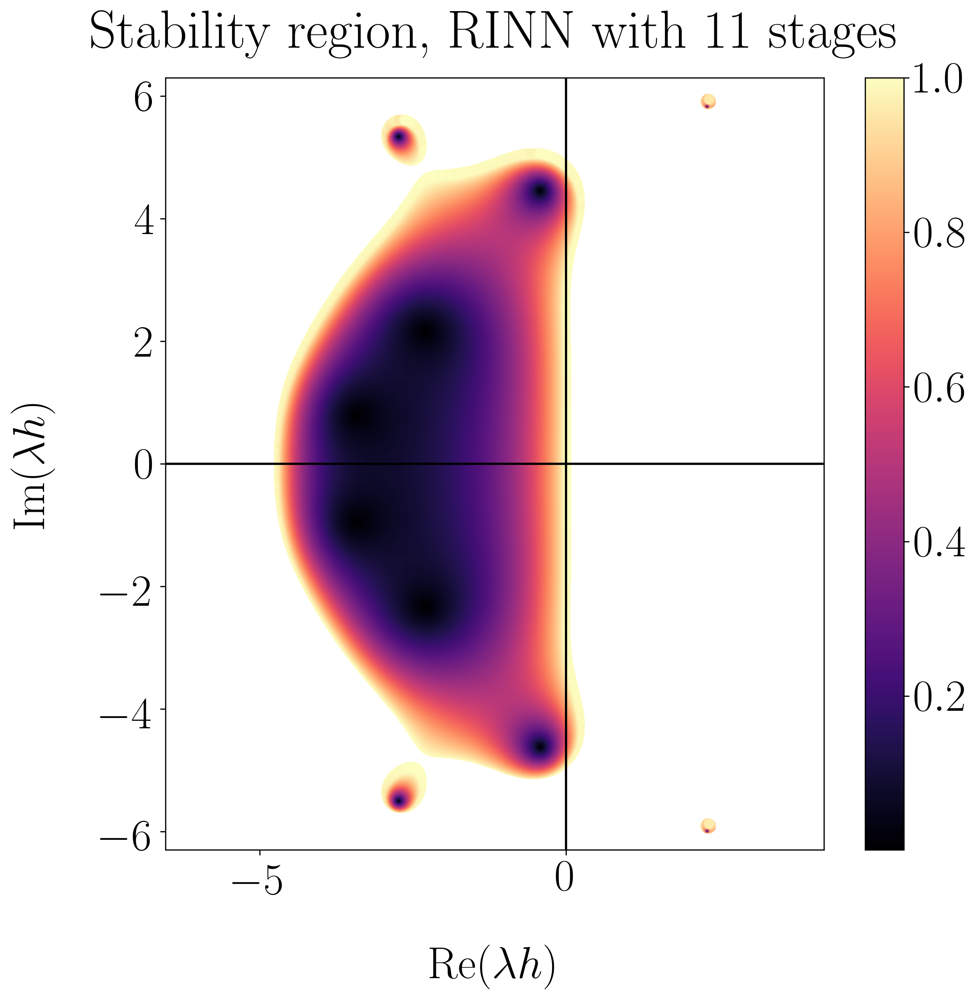

In [ ]:
plt.figure(figsize=(10,10))

plt.scatter(rz,iz,c=list(GRINN),cmap='magma')
plt.xlabel(r'$\mathrm{Re}(\lambda h)$')
plt.ylabel(r'$\mathrm{Im}(\lambda h)$')
plt.title('Stability region, RINN with 11 stages')
plt.colorbar()
plt.axis('equal')
#plt.xlim([-3,3])
#plt.ylim([-3,3])
plt.axhline(0, color='black')
plt.axvline(0, color='black')
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/Colab Notebooks/RINN-master/stabilityRINN11.png',dpi=300,bbox_inches='tight')

# perfs of the integration scheme with a different (smaller) timestep

In [ ]:
nb_steps_pred = 10000
t_pred = nb_steps_pred * GD.dt_integration
y_pred=np.zeros((nb_steps_pred,params['dim_output']))
tmp = np.reshape(np.ones(3),(1,params['dim_output']))
tmp = Variable(torch.from_numpy(tmp).float())

for i in range(nb_steps_pred):
    y_pred[i,:] = modelRINN(tmp,0.01,order)[0].data.numpy()
    tmp = Variable(torch.from_numpy(np.reshape(y_pred[i,:] ,(1,params['dim_output']))).float())

In [ ]:


fig = plt.figure(figsize=(20,10))
ax = fig.gca(projection='3d')  # Affichage en 3D
ax.plot(y_pred[2000:,0],y_pred[2000:,1],y_pred[2000:,2], label='Courbe',color='blue',alpha=0.5,linestyle='--')  # Tracé de la courbe 3D
ax.set_xlabel(r'$X$')
ax.set_ylabel(r'$Y$')
ax.set_zlabel(r'$Z$')
plt.tight_layout()
plt.show()

# Perfs of the RINN integration scheme on the L96 model

In [ ]:
nb_steps_pred = 400
t_pred = nb_steps_pred * GD.dt_integration
y_pred=np.zeros((nb_steps_pred,40))
tmp = np.ones((1,40))#np.reshape(catalog.analogs[0,:],(1,params['dim_output']))
tmp[0,20:] = 1+0.01
tmp = Variable(torch.from_numpy(tmp).float())

for i in range(nb_steps_pred):
    y_pred[i,:] = modelRINN.flow_True_Model_L96(tmp,0.05,order)[0].data.numpy()
    tmp = Variable(torch.from_numpy(np.reshape(y_pred[i,:] ,(1,40))).float())

<Figure size 3000x3000 with 0 Axes>

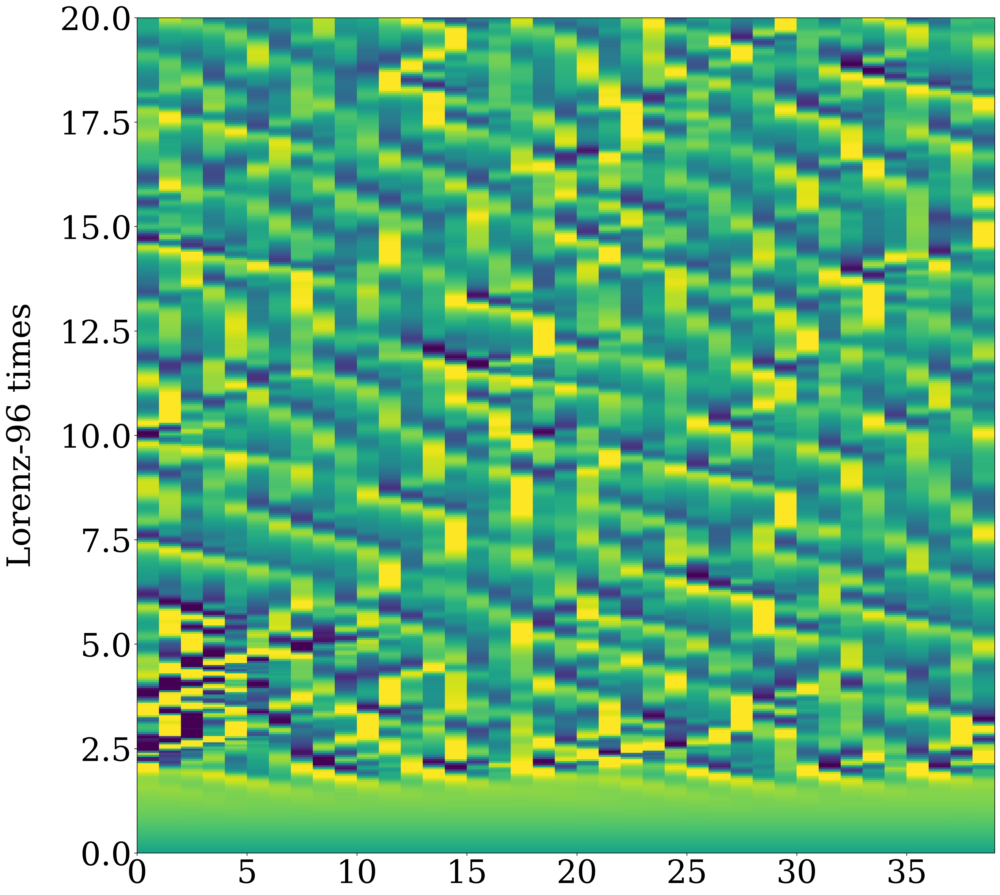

In [ ]:
import numpy as np
from tqdm import tqdm
length_h = 1000
import matplotlib as mpl
import matplotlib.pyplot as plt
plt.rcParams["mathtext.fontset"] = "cm"
import matplotlib.pyplot as plt
plt.rcParams.update({'font.size': 42})
plt.rcParams.update({
    "text.usetex": False,
    "font.family": "sans-serif",
    "font.sans-serif": ["Helvetica"]})
## for Palatino and other serif fonts use:
plt.rcParams.update({
    "text.usetex": False,
    "font.family": "serif",
     "font.sans-serif": ["Helvetica"]})
plt.rcParams['axes.titlepad'] = 20 
plt.figure(figsize=(10,10))
[X,Y]= np.meshgrid(range(40),np.linspace(0,nb_steps_pred*0.05,nb_steps_pred+1))
plt.figure(figsize=(20,20))
plt.pcolor(X,Y,y_pred);
plt.xlim([0,40-1]);
plt.clim([-10,10]);
plt.ylabel('Lorenz-96 times');
plt.savefig('/content/drive/MyDrive/Colab Notebooks/RINN-master/L96.png',dpi=300,bbox_inches='tight')

# Learnt Runge-Kutta params

In [ ]:
a

array([[ 0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ],
       [ 0.00650839,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ],
       [ 1.8328712 , -1.8263512 ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ],
       [-0.3417176 ,  0.6410858 , -0.2924907 ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ],
       [-0.9289149 ,  1.5891703 , -0.36369386, -0.10876002,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ],
       [ 1.249614  , -1.1265225 , -0.01642645, -0.05147021,  0.25321355,
         0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.   

In [ ]:
b

array([6.0785129e-05, 6.2489977e-05, 6.0249466e-02, 4.4961496e-05,
       8.4965315e-05, 6.8272093e-05, 5.1643103e-01, 5.1189145e-05,
       2.7464229e-01, 2.7553313e-05, 1.4827701e-01], dtype=float32)

In [ ]:
c

array([0.        , 0.00650839, 0.00652009, 0.00687752, 0.18780151,
       0.30840835, 0.31529987, 0.5187474 , 0.7068766 , 0.86898077,
       1.        ], dtype=float32)

In [ ]:
from tabulate import tabulate

In [ ]:
!pip install tabulate


In [ ]:
from tabulate import tabulate

In [ ]:
print(tabulate(a, tablefmt="latex", floatfmt=".5f"))

In [ ]:
b.shape